# <a href="https://miptstats.github.io/courses/ad_fivt.html">Введение в анализ данных</a>
## Домашнее задание 6. Линейная регрессия.


**Правила, <font color="red">прочитайте внимательно</font>:**




* Выполненную работу нужно отправить телеграм-боту `@miptstats_ds23_bot`. Для начала работы с ботом каждый раз отправляйте `/start`. Дождитесь подтверждения от бота, что он принял файл. Если подтверждения нет, то что-то не так. **Работы, присланные иным способом, не принимаются.**
* Дедлайн см. в боте. После дедлайна работы не принимаются кроме случаев наличия уважительной причины.
* Прислать нужно **ноутбук в формате `ipynb`**. Если вы строите интерактивные графики, их стоит прислать в формате html.
* Следите за размером файлов. **Бот не может принимать файлы весом более 20 Мб.** Если файл получается больше, заранее разделите его на несколько.
* Выполнять задание необходимо полностью самостоятельно. **При обнаружении списывания все участники списывания будут сдавать устный зачет.**
* Решения, размещенные на каких-либо интернет-ресурсах, не принимаются. Кроме того, публикация решения в открытом доступе может быть приравнена к предоставлении возможности списать.
* Для выполнения задания используйте этот ноутбук в качестве основы, ничего не удаляя из него. Можно добавлять необходимое количество ячеек.
* Комментарии к решению пишите в markdown-ячейках.
* Выполнение задания (ход решения, выводы и пр.) должно быть осуществлено на русском языке.
* Если код будет не понятен проверяющему, оценка может быть снижена.
* Никакой код из данного задания при проверке запускаться не будет. *Если код студента не выполнен, недописан и т.д., то он не оценивается.*
* **Код из рассказанных на занятиях ноутбуков** можно использовать без ограничений.


**Правила оформления теоретических задач:**

* Решения необходимо прислать одним из следующих способов:
  * фотографией в правильной ориентации, где все четко видно, а почерк разборчив,
    * отправив ее как файл боту вместе с ноутбуком
    * *или* вставив ее в ноутбук посредством `Edit -> Insert Image` при редактировании markdown-ячейки (<font color="red">фото, вставленные ссылкой, не принимаются</font>);
  * в виде $LaTeX$ в markdown-ячейках.
* Решения не проверяются, если какое-то требование не выполнено. Особенно внимательно все проверьте в случае выбора второго пункта (вставки фото в ноутбук). **<font color="red">Неправильно вставленные фотографии могут не передаться при отправке.</font>** Для проверки попробуйте переместить `ipynb` в другую папку и открыть его там.
* **В решениях поясняйте, чем вы пользуетесь**, хотя бы кратко. Например, если пользуетесь независимостью, то достаточно подписи вида "*X и Y незав.*"
* Решение, в котором есть только ответ, и отсутствуют вычисления, оценивается в 0 баллов.



**Баллы за задание:**

<b><font color="blue">Легкая часть</font></b> (достаточно на "хор"):
* Задача 1 &mdash; 40 баллов
* Задача 2 &mdash; 80 баллов

<b><font color="orange">Сложная часть</font></b> (необходимо на "отл"):
* Задача 3 &mdash; 50 баллов
* Задача 4 &mdash; 60 баллов
* Задача 5 &mdash; 30 баллов


In [755]:
# Bot check

# HW_ID: fpmi_ad6
# Бот проверит этот ID и предупредит, если случайно сдать что-то не то.

# Status: not final
# Перед отправкой в финальном решении удали "not" в строчке выше.
# Так бот проверит, что ты отправляешь финальную версию, а не промежуточную.
# Никакие значения в этой ячейке не влияют на факт сдачи работы.

In [756]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

sns.set(style='whitegrid', font_scale=1.3, palette='Set2')
%matplotlib inline

При решении задания используйте `sklearn`. Пропишите сюда необходимые импорты

In [757]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from sklearn.preprocessing import StandardScaler

### <font color="blue"><i>Легкая часть</i></font>

### Задача 1.

Рассмотрим одномерную линейную регрессию без свободного параметра $y(x) = \theta x$, где $x\in \mathbb{R}$ и $\theta \in \mathbb{R}$. Предполагаем, что данные получены по правилу
$$Y_i = \theta x_i + \varepsilon_i,$$
где $i \in \{1, ..., n\}$, числа $x_i \in \mathbb{R}$ неслучайны, а $\varepsilon_i$ &mdash; случайные ошибки.

**1.** Посчитайте оценку $\widehat{\theta}$ методом наименьших квадратов по явной формуле.

**2.** Выпишите формулы градиентного спуска (GD) и стохастического градиентного спуска (SGD) для поиска $\widehat{\theta}$. Не забудьте указать, как в SGD математически определяется батч (набор объектов на каждой итерации).

**3.** Пусть $\mathsf{E}\varepsilon_i = 0$, а $x \in \mathbb{R}$ &mdash; новый объект. Посчитайте $\mathsf{E}\widehat{\theta}$ и $\mathsf{E}\widehat{y}(x)$, где $\widehat{y}(x) = \widehat{\theta} x$.

**4.** Пусть $\mathsf{E}\varepsilon_i = 0$ и $\mathsf{D}\varepsilon_i = \sigma^2$, причем все $\varepsilon_i$ независимы, а $x \in \mathbb{R}$ &mdash; новый объект. Посчитайте $\mathsf{D}\widehat{\theta}$ и $\mathsf{D}\widehat{y}(x)$, где $\widehat{y}(x) = \widehat{\theta} x$.


### **1-4 пункты лежат в файле image_task1.pdf**

**5.** При каких условиях дисперсии в пункте 4 конечны? Подумайте и ответьте на вопрос, как ведет себя дисперсия предсказания в многомерном случае если матрица $X^T X$ близка к вырожденной.

Суммы квадратов элементов не должны быть равны 0, а значит дисперсии конечны при $X\neq0$.
Для многомерного случая дисперсия будет огромная, $X^T X$ близка к вырожденной, потому что мы должны посчитать обратную ей матрицу.


*Замечания.* 
1. В пунктах 3-5 речь идет о $\widehat{\theta}$, которая является *решением* задачи метода наименьших квадратов. Поэтому пользуйтесь явной формулой этого решения, а не формулами методов вычисления решения.
2. В ответе во всех пунктах могут оставаться суммы $n$ слагаемых, но не должно быть операций с векторами или матрицами.
3. **Прочитай требования к формату решения в правилах сдачи задания.**

---
### Задача 2.

Скоро лето &mdash; идеальное время года для путешествий и прогулок на велосипедах. В крупных городах обычно развиты сети проката велосипедов, предоставляющие удобный сервис. Одной из важных задач таких компаний является прогнозирование количества арендованных велосипедов в зависимости от времени года и погодных условий.

Рассмотрим датасет <a target="_blank" href="https://archive.ics.uci.edu/ml/datasets/Bike+Sharing+Dataset">Bike Sharing Dataset</a> от компании <a target="_blank" href="https://www.capitalbikeshare.com/">Capital Bikeshare</a>, располагающей автоматизированными пунктами проката велосипедов. В датасете по дням записаны календарная информация и погодные условия, а также число прокатов в этот день. Цель &mdash; предсказать количество арендованных велосипедов по остальным характеристикам.

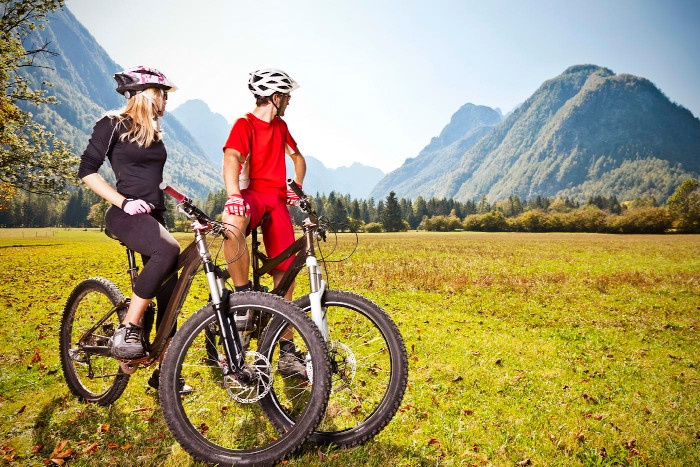

Будем работать только со следующими признаками:
* `season`: время года: 1 &mdash; зима, 2 &mdash; весна, 3 &mdash; лето, 4 &mdash; осень;
* `mnth`: месяц от 1 до 12;
* `holiday`: является ли текущий день праздничным;
* `weekday`: день недели от 0 до 6;
* `workingday`: является ли текущий день рабочим или выходным;
* `weathersit`: оценка благоприятности погоды от 1 (чистый, ясный день) до 4 (ливень, туман);
* `temp`: температура в Цельсиях;
* `atemp`: температура по ощущениям в Цельсиях;
* `hum`: влажность воздуха;
* `windspeed`: скорость ветра;
* `cnt`: количество арендованных велосипедов в текущий день.

Перед выполнением задания обязательно посмотрите <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html">ноутбук</a> с занятия по линейной регрессии.

---

Скачайте данные, загрузите их с помощью `pandas` и разделите на обучающую и тестовую части в соотношении 4:1. Далее всю аналитику необходимо проводить только на обучающей части данных.

In [758]:
data = pd.read_csv('day.csv', index_col=0)
data = data.drop(['dteday', 'yr', 'casual', 'registered'], axis=1)
data.head()

,season,mnth,holiday,weekday,workingday,weathersit,temp,atemp,hum,windspeed,cnt
instant,,,,,,,,,,,
1,1,1,0,6,0,2,0.344167,0.363625,0.805833,0.160446,985
2,1,1,0,0,0,2,0.363478,0.353739,0.696087,0.248539,801
3,1,1,0,1,1,1,0.196364,0.189405,0.437273,0.248309,1349
4,1,1,0,2,1,1,0.200000,0.212122,0.590435,0.160296,1562
5,1,1,0,3,1,1,0.226957,0.229270,0.436957,0.186900,1600


In [759]:
data.shape

(731, 11)

In [760]:
train, test = train_test_split(data, test_size=0.2)
train.shape, test.shape

((584, 11), (147, 11))

#### 1. Визуальный анализ

Посмотрите по графикам, как *целевой признак зависит от остальных* и поймите характер этой зависимости. Старайтесь строит информативные графики.

Какие признаки категориальные, а какие &mdash; вещественные? Учтите это при построении информативных графиков.

In [761]:
categorial_features = ['season', 'mnth', 'holiday', 'weekday', 'workingday', 'weathersit']
real_features = ['temp', 'atemp', 'hum', 'windspeed']
target_features = 'cnt'

/Users/fomin_ivan/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/Users/fomin_ivan/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/Users/fomin_ivan/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/Users/fomin_ivan/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/Users/fomin_ivan/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: No contour levels were found within the data range.
  cset = contour_func(
/Users/fomin_ivan/opt/anaconda3/lib/python3.9/site-packages/seaborn/distributions.py:1210: UserWarning: N

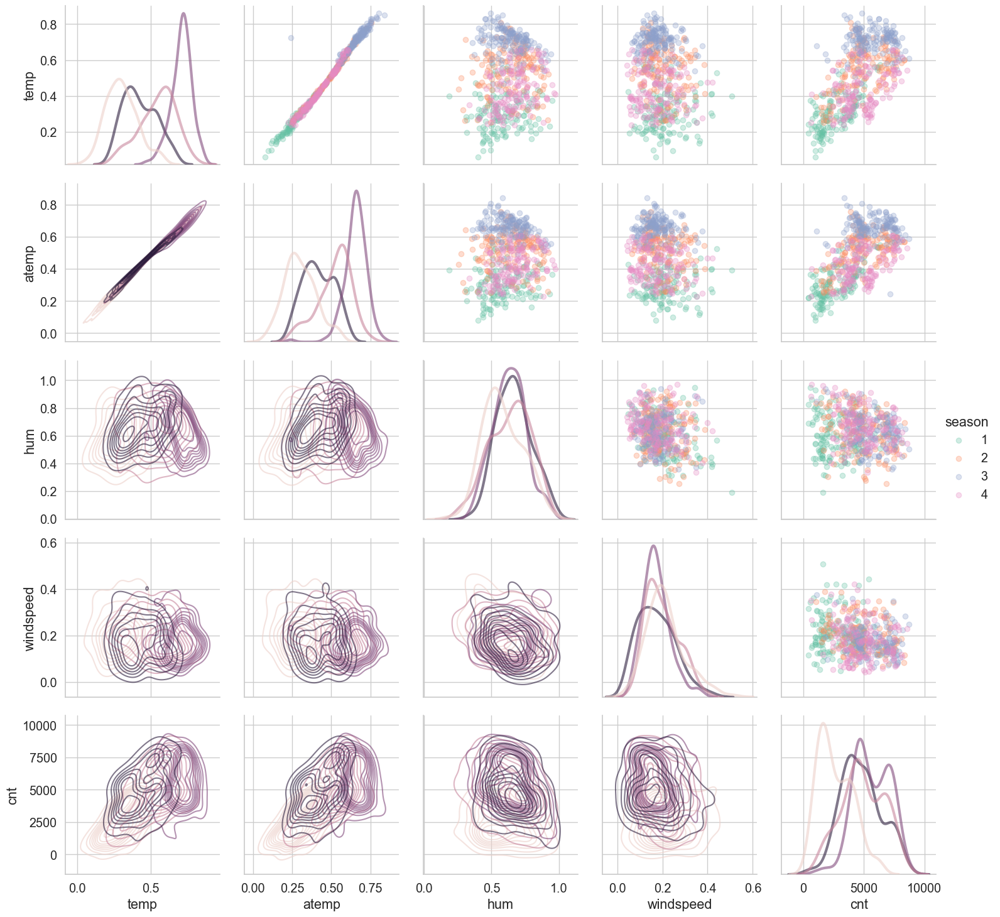

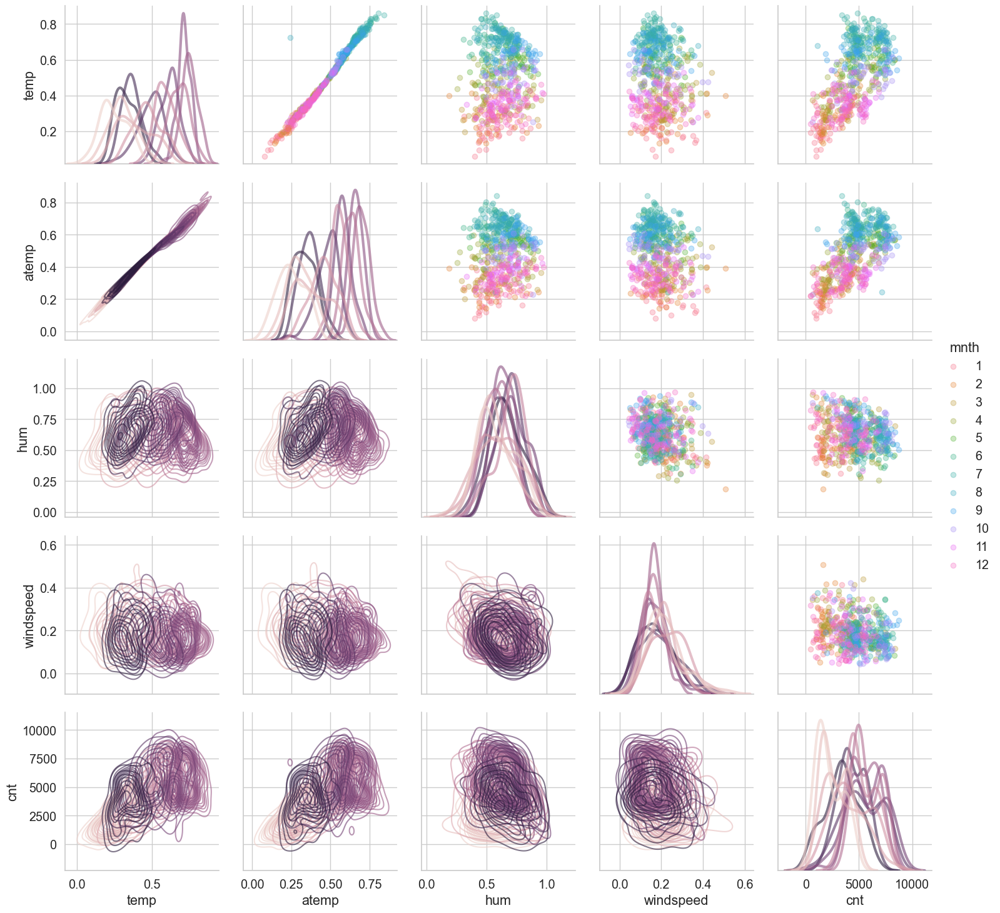

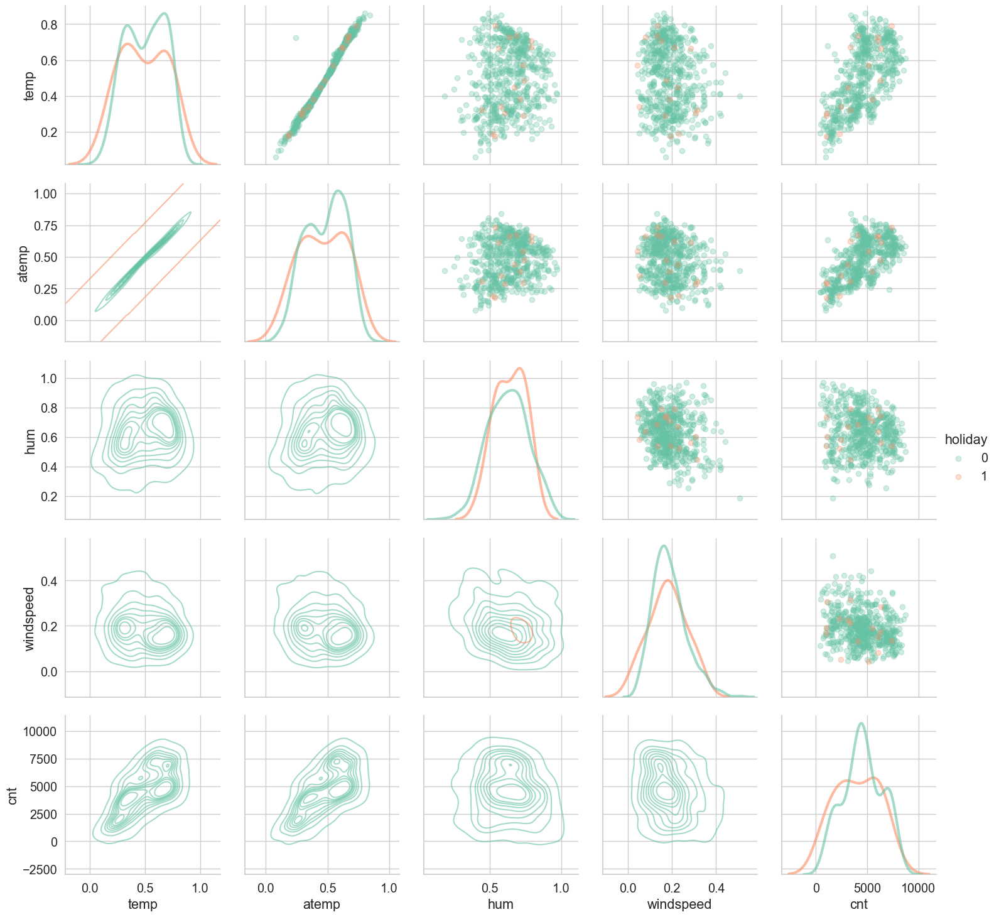

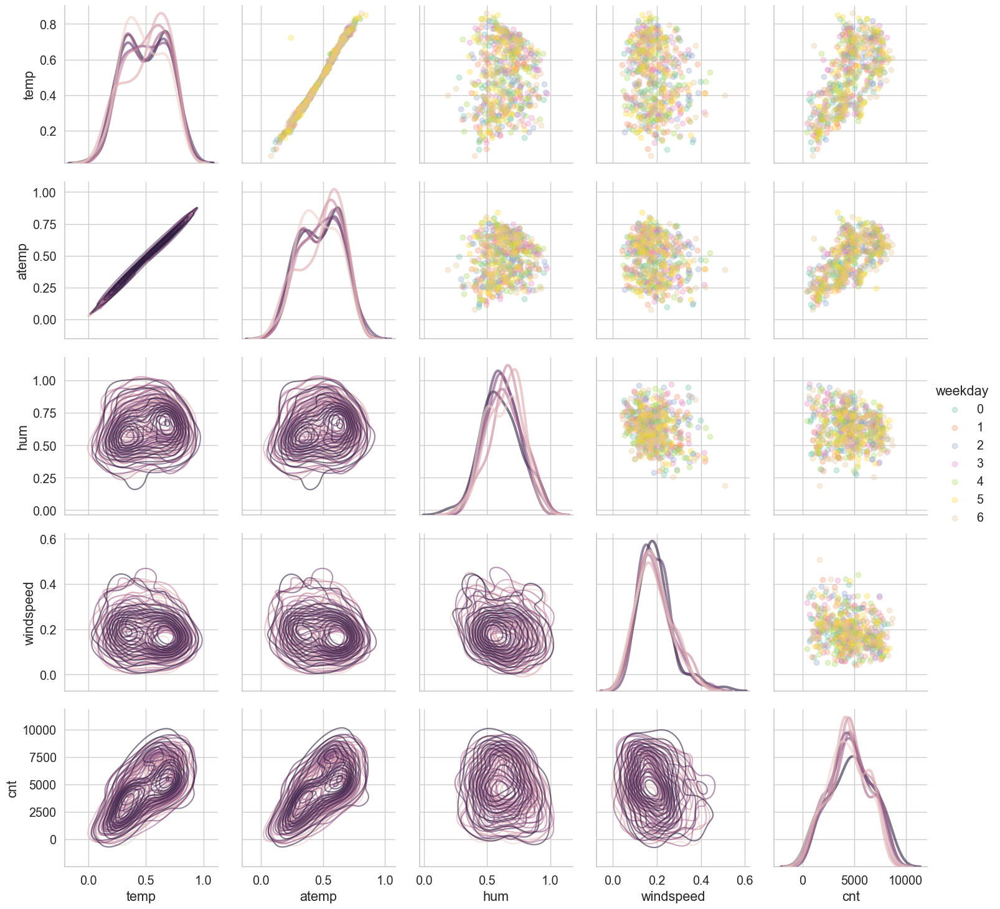

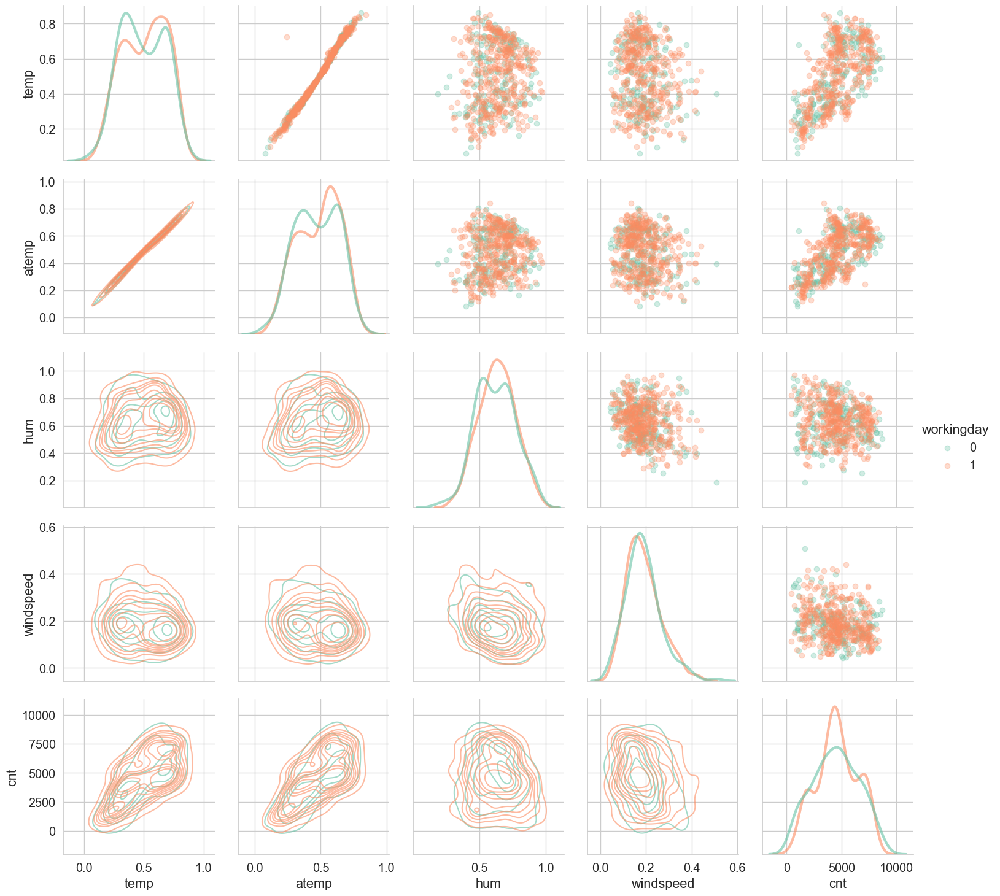

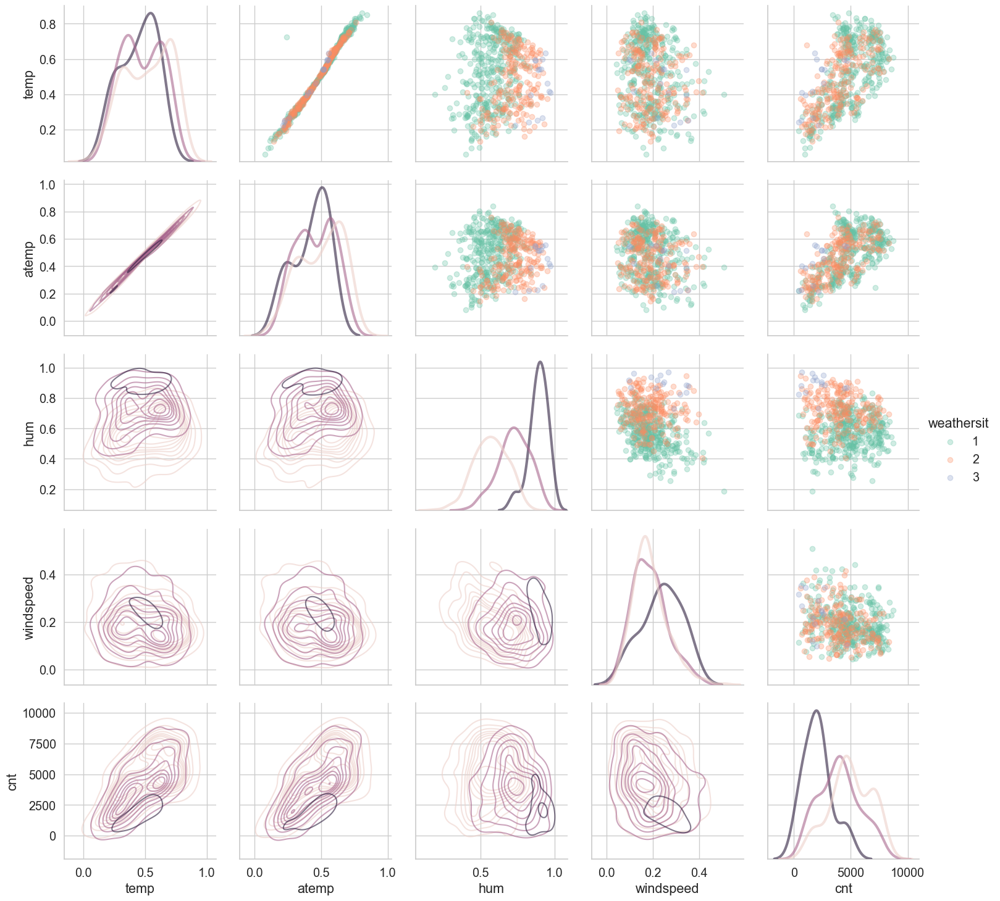

In [762]:
for hue in categorial_features:
    g = sns.PairGrid(train[['temp', 'atemp', 'hum', 'windspeed', 'cnt', hue]], hue=hue, diag_sharey=False, height=3)

    g.map_lower(sns.kdeplot, alpha=0.6)
    g.map_upper(plt.scatter, alpha=0.3)
    g.map_diag(sns.kdeplot, lw=3, alpha=0.6, common_norm=False)

    g.add_legend()

Сделайте выводы по графикам. В частности, ответьте на следующие вопросы.
* Есть ли в данных явные выбросы, то есть точки, далеко находящиеся от основной массы точек?
* Стоит ли рассматривать какие-либо нелинейные функции от признаков? Не стоит придумывать сложные функции, достаточно рассмотреть $x^2$, $\log x$ и $I\{x > c\}$.



**Выводы по графикам:**
На графике сразу можно увидеть яркую зависимость -- чем выше температура, тем больше целевой признак.
На графиках мы видим выбросы, а конкретно (hum, cnt) и (windspeed, cnt). Смысла в том, чтобы апроксимировать какими-то нелинейными функциями, на мой взгляд нет, так как зависимости вполне неплохо описываются линейными функциями.
Также можно отметить линейную зависимость `temp` и `atemp`. Учитывая близость этих параметров, можно будет убрать один из них.

#### 2. Подготовка данных

Опишите по шагам процедуру предобработки данных, которая будет включать работу с выбросами, преобразования вещественных и категориальных признаков, возможно, что-то еще.

**Процедура предобработки данных:**

**a).** Избавимся от выбросов в вещественных признаках.
**б).** Закодируем категориальные признаки *OneHotEncoding*

Реализуйте данную процедуру.

Посмотрим на выбросы.

<AxesSubplot:>

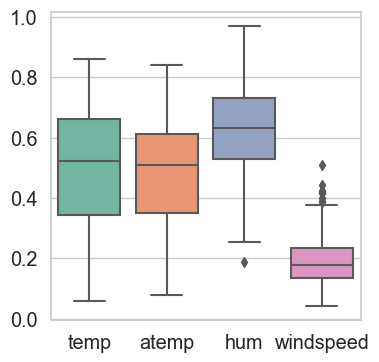

In [763]:
plt.figure(figsize=(4, 4))
sns.boxplot(data=train[real_features])

Уберем найденные выбросы

In [764]:
train = train[train['windspeed'] < 0.33][train['hum'] > 0.35]

/var/folders/1w/v_pdz1hx607dnqpw4pt35zlm0000gn/T/ipykernel_887/3404351530.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  train = train[train['windspeed'] < 0.33][train['hum'] > 0.35]


In [765]:
encoder = OneHotEncoder(drop='first', sparse=False)  # объявляем модель
train_cat = encoder.fit_transform(train[categorial_features])  # обучаем и кодируем
train_cat

array([[0., 0., 0., ..., 1., 1., 0.],
       [1., 0., 0., ..., 1., 1., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       ...,
       [0., 0., 0., ..., 1., 1., 0.],
       [0., 0., 1., ..., 0., 0., 0.],
       [0., 1., 0., ..., 0., 0., 0.]])

In [766]:
X_train = np.hstack([train[real_features], train_cat])
X_train.shape

(542, 28)

#### 3. Обучение модели и ее анализ

Обучите линейную регрессию из `sklearn` на полученных данных и посмотрите на полученные оценки коэффициентов (в т.ч. свободный коэффициент).

In [767]:
model = LinearRegression()
model.fit(X_train, train[target_features])

LinearRegression()

In [768]:
model.coef_ # Оценки коэффициентов перед признаками

array([ 6082.81319841,   183.50109645, -3462.80382823, -3716.65276122,
         851.18425769,   455.75449543,  1482.92022506,   281.53359831,
         391.75784095,   103.47446763,   387.064465  ,   -43.07630884,
        -295.92852133,   261.86181917,   850.61850534,   512.39079258,
          54.83641608,   -25.90022356,  -237.35474828,   -43.42614662,
          43.83473771,   -45.33769008,    33.97557917,    22.95133372,
         444.65956566,   249.35256217,  -226.55690018, -1542.66860471])

In [769]:
model.intercept_ # Оценка свободного коэффициента

3292.075768110063

Посчитайте ошибку предсказания на тестовой выборке по метрикам RMSE, MAE, MAPE. Подробнее можно почитать в <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#3.-Тестирование-и-оценка-качества">ноутбуке</a> с занятия.

*Замечание.* Если в тестовой части тоже есть "большие" выбросы, их стоит убрать. Наша модель не должна пытаться их предсказать, но в то же время выбросы вносят существенный вклад в значение метрики. 

<AxesSubplot:>

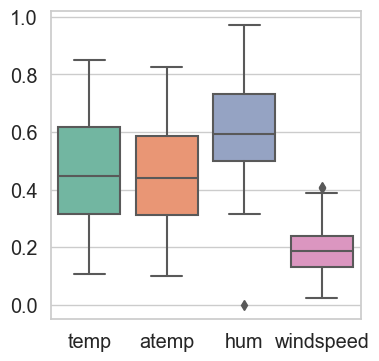

In [770]:
# Найдем выбросы в тестовой выборке
plt.figure(figsize=(4, 4))
sns.boxplot(data=test[real_features])

In [771]:
test = test[test['windspeed'] < 0.3]

In [772]:
# Кодируем категориальные признаки с помощью метода transform обученного ранее кодировщика
test_cat = encoder.transform(test[categorial_features])

# Соединяем данные
X_test = np.hstack([test[real_features], test_cat])

Выполним предсказание построенной ранее моделью с помощью метода predict

In [773]:
test_preds = model.predict(X_test)

RMSE

In [774]:
metrics.mean_squared_error(test[target_features], test_preds) ** 0.5

1330.8482480307198

MAE

In [775]:
metrics.mean_absolute_error(test[target_features], test_preds)

1100.418779955378

MAPE

In [776]:
def mean_absolute_percentage_error(y_true, y_pred):
    return 100 * (np.abs(y_true - y_pred) / y_true).mean()

In [777]:
metrics.mean_absolute_percentage_error(test[target_features], test_preds)

0.3620655268209881

Попробуйте посчитать оценку коэффициентов с помощью формулы, полученной на занятии. Не забудьте про константный признак. В чем заключается проблема?

*Подсказка.* Подумайте о зависимостях между признаками.

In [778]:
Y = train[target_features] # целевой признак
X = np.insert(X_train, 0, np.array([1] * len(train[target_features])), axis=1)

O = (np.linalg.inv(X.T @ X)) @ X.T @ Y  # посчитаем коэффициенты (O == типо буква ТЕТА)
intercept = O[0]  # свободный коэффициент
O = np.delete(O, 0)  # коэффициенты перед признаками

In [779]:
O # Коэфиценты

array([ 1.97682433e+07, -1.98634619e+07,  2.54466832e+05, -1.09482893e+06,
       -4.12907219e+04, -2.98264876e+05, -1.32514851e+05, -4.70350070e+04,
       -2.70306016e+05, -2.88028210e+05, -6.56251768e+05, -8.63830513e+05,
       -8.19423378e+05, -9.65977274e+05, -6.08640396e+05, -2.81498339e+05,
        3.02530432e+04,  1.35537019e+04,  3.31218239e+05, -3.80375237e+05,
       -3.38555106e+05, -3.36479869e+05, -3.57804831e+05, -3.58050217e+05,
        4.44659566e+02,  3.49958569e+05, -2.26556900e+02, -1.54266860e+03])

In [780]:
intercept # Свободный коэф

210589.41977675667

In [781]:
Y = test[target_features] # целевой признак
X = X_test @ O + intercept # предсказания

In [782]:
mean_absolute_percentage_error(Y, X)

6368.486699027193

Насколько я понял, все дело в признаках, которые у нас линейно зависимые, в частности temp и atemp. Это как раз и способствует тому, что матрица очень близка к вырожденной, так как столбцы линейно зависимые.

Исправьте эту проблему, посчитайте оценки коэффициентов, а также ошибку предсказания.

Уберем признак temp

In [783]:
real_features.remove('temp')

In [784]:
Y = train[target_features].to_numpy()
X = np.hstack([train[real_features], train_cat])
X = np.insert(X, 0, np.array([1] * len(train[target_features])), axis=1)

O = (np.linalg.inv(X.T @ X)) @ X.T @ Y  # посчитаем коэффициенты
intercept = O[0]  # свободный коэффициент
O = np.delete(O, 0)  # коэффициенты перед признаками

In [785]:
mean_absolute_percentage_error(test[target_features], np.hstack([test[real_features], test_cat]) @ O + intercept)

206.17309689055637

Сделайте выводы.

**Выводы:**

Точность увеличилась после исправления найденной ошибки.

Модель, которая у нас получилась, предсказывает целевой признак с примерно 50-ти процентной точностью, что на мой взгляд, достаточно хорошо для первого раза. В принципе таким образом мы подтвердили то, что нам ненужны никакие нелинейные зависимости, так как данные описываются линейными функциями.

*Замечание.* Не расстраивайтесь, если у вас получится не очень хорошее качество, это нормально. Вы провели только небольшую предобработку данных и обучили *простую* модель. Более сложные методы обработки данных и обучения ждут вас впереди. Главное &mdash; с чего-то начать!

### <font color="orange"><i>Сложная часть</i></font>

### Задача 3.

Как можно было увидеть ранее, оценки коэффициентов становятся слишком большими при наличии некоторых проблем с данными. Чтобы этого не происходило, часто выполняют процедуру *регуляризации* в модели. 

Пусть $X \in \mathbb{R}^{n \times d}$ &mdash; матрица признаков, $Y \in \mathbb{R}^{n}$ &mdash; вектор значений целевого признака, $\theta \in \mathbb{R}^{d}$ &mdash; неизвестный вектор параметров. В методе наименьших квадратов решается задача
$$\| Y - X\theta \|^2 \longrightarrow \min_\theta.$$
Регуляризация заключается в искусственном усечении значений вектора оценок коэффициентов путем добавления его нормы к оптимизируемому функционалу. Тем самым решается задача
$$\| Y - X\theta \|^2 + \lambda \| \theta \|^2 \longrightarrow \min_\theta,$$
где $\lambda > 0$ &mdash; гиперпараметр модели, то есть число, которое задается пользователем. Такая модель называется **Ridge-регрессией**.

*Замечание.* Такая модель дает некоторое *другое приближение* неизвестной зависимости. Но неправильно думать, что она не может дать "правильный" ответ, потому как понятия "правильный ответ" в подобных задачах не существует. Можно получить только *более качественное приближение* согласно выбранной метрике, например, RMSE.

**1.** Найдите оценку $\theta$ в модели ridge-регрессии. Сравните ее с оценкой коэффициентов в методе наименьших квадратов. Помогает ли она избавиться от проблемы обратимости матрицы в МНК, которая обсуждалась на занятии?

### **Формулы для 1 и 2 лежат в файле image_task3.pdf**

Пояснения:
На первый взгляд у нас до сих пор есть проблема с обратной матрицей, но теперь, если у матрицы $X^TX$ нет обратной, то в дело вступает $\lambda$.
Дело в том, что мы можем подобрать такую $\lambda$, что матрица $X^TX + \lambda E$ будет невырожденной. В этом и есть суть *ridge-регрессии.*

**2.** Выпишите формулу поиска оценки коэффициентов методом *градиентного спуска* и *стохастического градиентного спуска* для модели ridge-регрессии. Не забудьте указать, как математически определяется батч (набор объектов на каждой итерации).

### **Формулы для 1 и 2 лежат в файле image_task3.pdf**

**3.** Многие модели машинного обучения требуют *стандартизацию признаков*. Существует множество различных способов стандартизации, из которых наиболее распространены два следующих.
1. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.StandardScaler.html"><it>StandardScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ &mdash; выборочное среднее значение признака $j$ (функция `np.mean`), а $s^2_j$ &mdash; выборочную дисперсию признака $j$ (функция `np.var`). Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{s_j}.$$
2. <a target="_blank" href="https://scikit-learn.org/stable/modules/generated/sklearn.preprocessing.MinMaxScaler.html"><it>MinMaxScaler</it></a>. Пусть $x_{ij}$ &mdash; значение признака $j$ для объекта $i$. Обозначим $m_j$ и $M_j$ &mdash; минимальное и максимальное значения признака $j$ соответственно. Тогда стандартизацией является преобразование
$$\widetilde{x}_{ij} = \frac{x_{ij} - m_j}{M_j - m_j}.$$

Для метода наименьших квадратов стандартизацию признаков можно не производить, однако для модели ridge-регрессии стандартизация необходима. Поясните это. Можно представить, что признаки имеют некоторые различные единицы измерения.

Проблема в том, что у каждого признака могут быть свои единицы измерения, например у одного км, а у другого см. Таким образом, добавляя $\lambda \| \theta \|^2$ в каждый столбец мы все сломаем, у нас будет перекос в сторону одного из признаков. Для этого стандартизация и нужна.
Для Метода наименьших квадратов это не требуется, так как в каждом столбце свои единицы измерения и никакого перекоса просто случится не может.

### Задача 4.

В данной задаче мы продолжим анализировать данные велопроката из задачи 2.

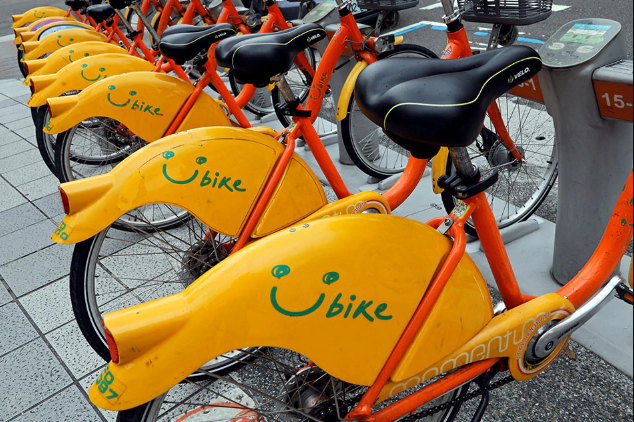

Для начала реализуйте класс для работы с моделью ridge-регрессии, используя явную формулу из предыдущей задачи. Интерфейс этого класса соответствует стандарту библиотеки `sklearn`, который использует также множество других библиотек.

In [786]:
class RidgeRegression:
    def __init__(self, lambd=0.1, fit_intercept=True):
        '''
        Инициализация модели.
        
        Аргументы:
        lambd -- параметр регуляризации.
        fit_intercept -- добавить ли константный признак.
        '''

        self.lambd = lambd
        self.fit_intercept = fit_intercept
        
        
    def fit(self, X, Y):
        '''
        Обучение модели ridge-регрессии.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        Y -- numpy-вектор значений целевого признака размера (n,).
        '''
        self.Y = Y

        if self.fit_intercept == False:
            self.X = X
        else:
            self.X = np.insert(X, 0, np.array([1] * len(X)), axis=1)
        # Посчитайте оценки коэффициентов и, возможно, 
        # еще что-то, что пригодится в predict.

        self.theta = np.linalg.inv(self.X.T @ self.X + self.lambd * np.eye(len(self.X.T @ self.X))) @ self.X.T @ self.Y
        self.intercept_ = self.theta[0]
        self.coef_ = np.delete(self.theta, 0)
        return self
    
    
    def predict(self, X):
        '''
        Вычисление предсказаний.
        
        Аргументы:
        X -- numpy-матрица объект-признак размера (n, d);
        
        Возвращает:
        predictions -- предсказания в виде numpy-вектора размера (n,).
        '''
        
        # Посчитайте предсказания
        predictions = (X @ self.coef_) + self.intercept_
        return predictions

Разделите данные на три части &mdash; обучающую, валидационную и тестовую в соотношении 3:1:1. На первой из них вам необходимо проводить всю аналитику и обучать все модели &mdash; регрессию, скалирование и т.д.. Вторую вы будете использовать для выбора оптимального значения гиперпараметра. Наконец, тестовую выборку необходимо использовать только для вычисления итогового значения метрик выбранной модели. Именно эти числа вам нужно говорить заказчику.

Подробнее посмотрите в <a href="https://miptstats.github.io/courses/ad_fivt/ML_pipeline.pdf">презентации</a> с занятия.

In [787]:
tmp_data, test = train_test_split(data, test_size=0.2)
train, valid = train_test_split(tmp_data, test_size=0.25)

In [788]:
train.shape, valid.shape, test.shape

((438, 11), (146, 11), (147, 11))

Выполните необходимые преобразования признаков. Не забудьте, что <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#2.-Обучение">обучить преобразования</a> нужно только по обучающей выборке. Учтите все особенности, которые обсуждались ранее в данном задании.

<AxesSubplot:>

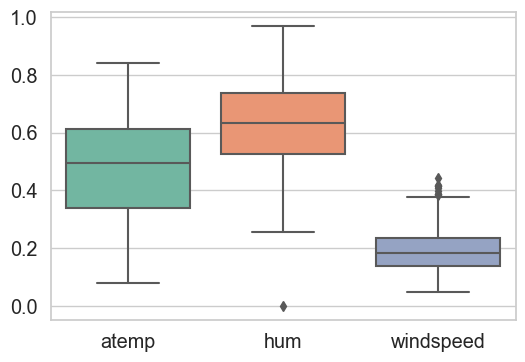

In [789]:
# Для начала разберемся с выбросами
plt.figure(figsize=(6, 4))
sns.boxplot(data=train[real_features])

In [790]:
train = train[train['windspeed'] < 0.35][train['hum'] > 0.25]

/var/folders/1w/v_pdz1hx607dnqpw4pt35zlm0000gn/T/ipykernel_887/383656018.py:1: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  train = train[train['windspeed'] < 0.35][train['hum'] > 0.25]


In [791]:
encoder = OneHotEncoder(drop='first', sparse=False)
train_cat = encoder.fit_transform(train[categorial_features])
X_train = np.hstack([train[real_features], train_cat])

encoder.categories_

[array([1, 2, 3, 4]),
 array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12]),
 array([0, 1]),
 array([0, 1, 2, 3, 4, 5, 6]),
 array([0, 1]),
 array([1, 2, 3])]

Сделаем dict и list, которые понадобятся нам в дальнейшем

In [792]:
# Сделаем все то же самое с valid данными

<AxesSubplot:>

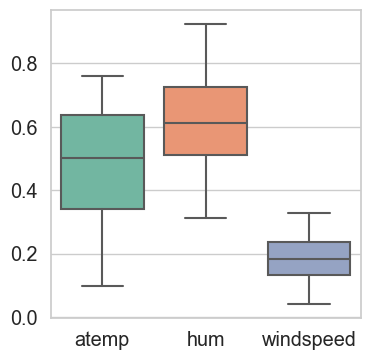

In [821]:
plt.figure(figsize=(4, 4))
sns.boxplot(data=valid[real_features])

In [822]:
# Уберем выбросы
valid = valid[valid['windspeed'] <= 0.33]

In [823]:
encoder = OneHotEncoder(drop='first', sparse=False)
valid_cat = encoder.fit_transform(valid[categorial_features])
X_valid = np.hstack([valid[real_features], valid_cat])

In [824]:
scaler = StandardScaler()
X_train = scaler.fit_transform(y=train[target_features], X=X_train)

In [825]:
Y_valid = valid[target_features]
Y_train = train[target_features]

Определите сетку значений гиперпараметра $\lambda$ и обучите для каждого значения сетки модель ridge-регрессии. Обычно эффективнее брать сетку в логарифмическом масштабе, воспользовавшись `np.logspace`.

In [826]:
log_grid = np.logspace(-2, 3, num=1000)

Для каждой из них посчитайте ошибку по метрикам RMSE, MAE, MAPE по обучающей и валидационной выборкам. Подробнее можно почитать в <a href="https://miptstats.github.io/courses/ad_fivt/linreg_sklearn.html#3.-Тестирование-и-оценка-качества">ноутбуке</a> с занятия.

In [827]:
# Создадим нужные списки
RMSE_train, MAE_train, MAPE_train = [], [], []
RMSE_valid, MAE_valid, MAPE_valid = [], [], []
intercepts, thetas, models = [], [], []

In [828]:
for i in log_grid:
    tmp = RidgeRegression(lambd=i)
    tmp.fit(Y=Y_train, X=X_train)
    predicted = tmp.predict(X=X_train)
    models.append(tmp)

    MAPE_train.append(mean_absolute_percentage_error(train[target_features].to_numpy(), predicted))
    RMSE_train.append(metrics.mean_squared_error(train[target_features].to_numpy(), predicted) ** 0.5)
    MAE_train.append(metrics.mean_absolute_error(train[target_features].to_numpy(), predicted))

    intercepts.append(tmp.intercept_)
    thetas.append(tmp.coef_)

    scaler = StandardScaler()

    Y_train = train[target_features]
    X_train = scaler.fit_transform(y=train[target_features], X=X_train)

    predicted = tmp.predict(X=X_valid)  # предсказания по модели для валидных данных

    MAPE_valid.append(mean_absolute_percentage_error(Y_valid, predicted))
    RMSE_valid.append(metrics.mean_squared_error(Y_valid, predicted) ** 0.5)
    MAE_valid.append(metrics.mean_absolute_error(Y_valid, predicted))

In [829]:
intercepts = np.array(intercepts)
thetas = np.array(thetas)

Для каждой метрики постройте графики зависимости значений метрики от значения гиперпараметра. Сравните поведение значений метрик для обучающей и валидационной выборок.

Text(0.5, 1.0, 'Зависимость MAE от $\\lambda$')

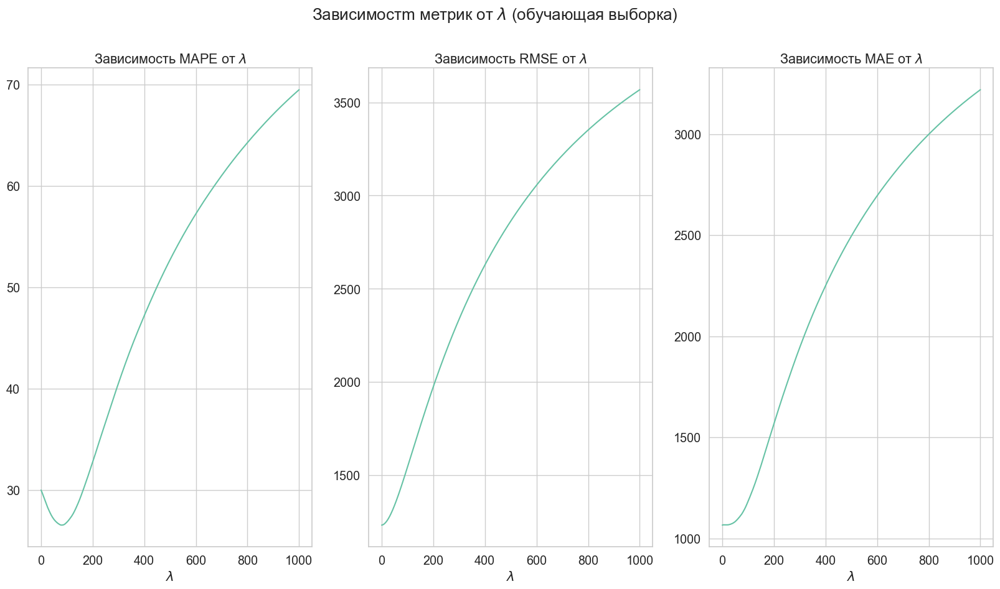

In [830]:
plt.figure(figsize=(20, 10))
plt.suptitle(R'Зависимостm метрик от $\lambda$ (обучающая выборка)')

plt.subplot(1, 3, 1)
plt.plot(log_grid, MAPE_train)
plt.xlabel('$\lambda$')
plt.title(R'Зависимость MAPE от $\lambda$')

plt.subplot(1, 3, 2)
plt.plot(log_grid, RMSE_train)
plt.xlabel('$\lambda$')
plt.title(R'Зависимость RMSE от $\lambda$')

plt.subplot(1, 3, 3)
plt.plot(log_grid, MAE_train)
plt.xlabel('$\lambda$')
plt.title(R'Зависимость MAE от $\lambda$')

Text(0.5, 1.0, 'Зависимость MAE от $\\lambda$')

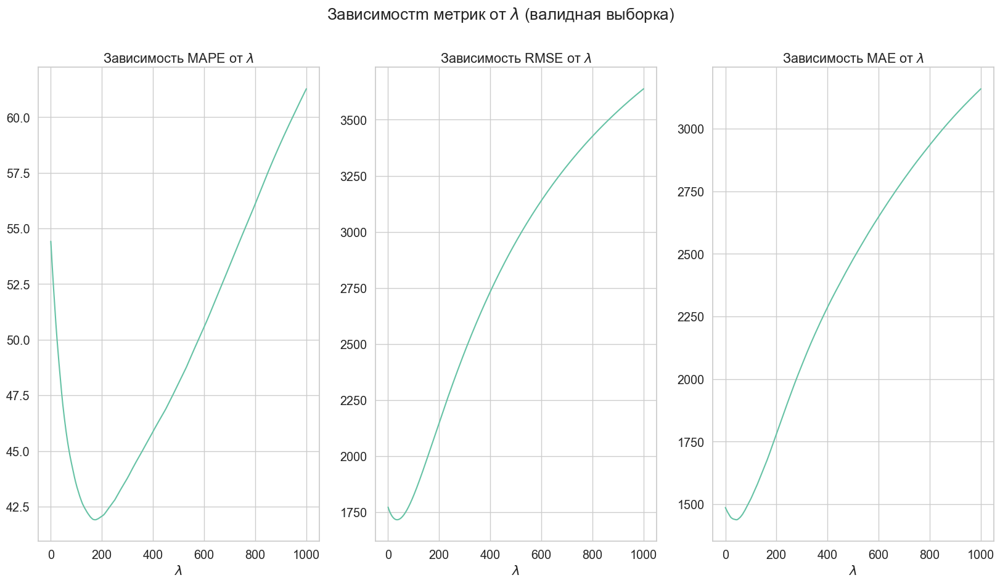

In [831]:
plt.figure(figsize=(20, 10))
plt.suptitle(R'Зависимостm метрик от $\lambda$ (валидная выборка)')

plt.subplot(1, 3, 1)
plt.plot(log_grid, MAPE_valid)
plt.xlabel('$\lambda$')
plt.title(R'Зависимость MAPE от $\lambda$')

plt.subplot(1, 3, 2)
plt.plot(log_grid, RMSE_valid)
plt.xlabel('$\lambda$')
plt.title(R'Зависимость RMSE от $\lambda$')

plt.subplot(1, 3, 3)
plt.plot(log_grid, MAE_valid)
plt.xlabel('$\lambda$')
plt.title(R'Зависимость MAE от $\lambda$')

На 1 графике видно, что не если убрать выбросы, то метрики увеличиваются с ростом $\lambda$
В свою очередь, на 2-ом графике видно, что метрики достигают своего минимума, а только после этого начинают расти с увеличением $\lambda$

Постройте также на одном графике кривые зависимости значений оценок коэффициентов от значений гиперпараметра. Какая наблюдается зависимость? Как вы это можете охарактеризовать?

*Замечание*. Возможно, будет информативнее рисовать графики в логарифмическом масштабе. Для наглядности можно также попробовать рисовать одним цветом все кривые, которые относятся к одному *исходному* признаку.

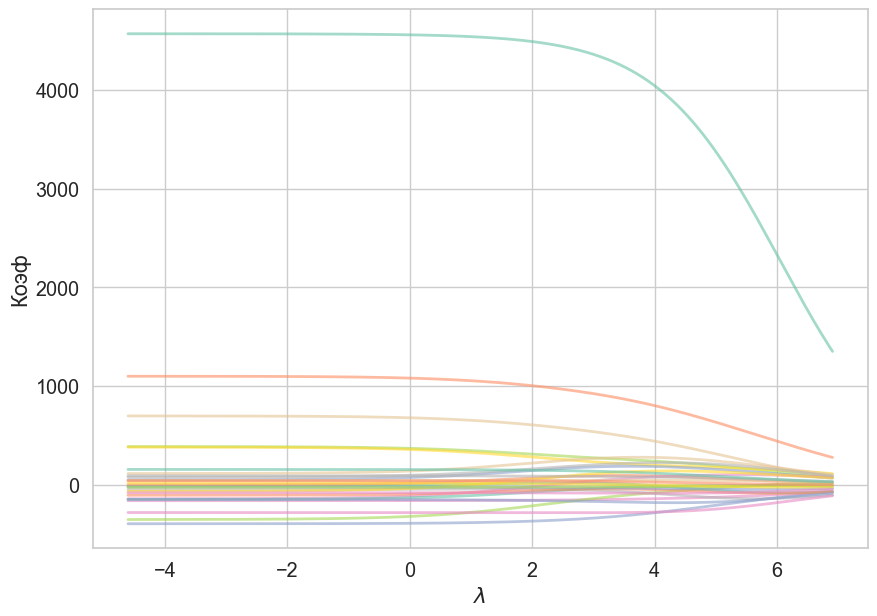

In [832]:
plt.figure(figsize=(10, 7))
for i in range(len(models[0].theta)):
    plt.plot(np.log(log_grid), [models[k].theta[i] for k in range(len(models))], alpha=0.6, lw=2)
plt.ylabel('Коэф')
plt.xlabel(r'$\lambda$')
plt.show()

**ВЫВОД:** В среднем есть тенденция на уменьшение коэфицента с увеличением $\lambda$

Выберите оптимальное значение гиперпараметра и посчитайте ошибку на тестовой выборке.

In [833]:
min(MAE_valid), min(MAPE_valid), min(RMSE_valid)

(1438.2991948418382, 41.91130189513606, 1716.046352383919)

In [834]:
min_MAPE = min(MAPE_valid)
lambd_idx = (MAPE_valid.index(min_MAPE))
lambd = log_grid[lambd_idx]

In [835]:
encoder = OneHotEncoder(drop='first', sparse=False)
test_cat = encoder.fit_transform(test[categorial_features])
X_test = np.hstack([test[real_features], test_cat])

In [836]:
scaler = StandardScaler()
X_test= scaler.fit_transform(y=test[target_features], X=X_test)
Y_test = test[target_features]

In [837]:
model_opt = RidgeRegression(lambd=lambd)
model_opt.fit(Y=Y_train, X=X_train)
predict = model_opt.predict(X=X_test)

In [838]:
print('MAPE =', mean_absolute_percentage_error(test[target_features].to_numpy(), predict))
print('MSE =', metrics.mean_squared_error(test[target_features].to_numpy(), predict) ** 0.5)
print('MAE =', metrics.mean_absolute_error(test[target_features].to_numpy(), predict))

MAPE = 33.970580076531185
MSE = 1891.5131979943094
MAE = 1498.0324963513767


Сделайте выводы.

 **Вывод:**
 **Ridge-регрессия** очень хорошо помогает в улучшении результатов в сравнении с Методом наименьших квадратов. Путем выбора оптимального гиперпараметра и решения проблемы вырожденности, а подбираем мы гиперпараметр по валидной выборке, на которой мы можем найти минимум.

### Задача 5.

Предположим, что имеющиеся у нас данные по велопрокату &mdash; большие данные. Конечно же в реальности это не так. Однако, для простой учебной задачи это в самый раз, чтобы ничего ни у кого не подвисало.

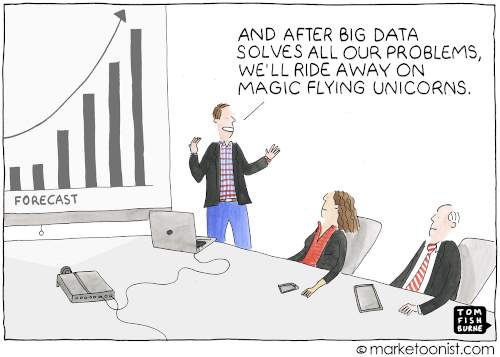

Выберите некоторое начальное приближение оценок коэффициентов, например, в начале координат.

In [839]:
theta = [0] * (1 + len(model_opt.coef_))

Реализуйте процедуру стохастического градиентного спуска для поиска оценок коэффициентов в модели ridge-регрессии. Размер батча (набор объектов на каждой итерации) обычно берут кратно степени двойки, например, 128 или 256. Значение $\lambda$ можно взять из предыдущей задачи.

In [840]:
lambd = min_MAPE
eta = 0.001
k = 128

In [841]:
thetas = [theta]
RMSE_train, MAE_train, MAPE_train = [], [], []
RMSE_valid, MAE_valid, MAPE_valid = [], [], []
intercepts, models = [], []

In [842]:
for _ in range(1500):
    rand_k_train = np.random.randint(len(X_train), size=k)
    rand_k_valid = np.random.randint(len(X_valid), size=k)

    tmp_train = np.array([1] * len(X_train[rand_k_train]))
    XI = np.insert(X_train[rand_k_train], 0, tmp_train, axis=1)
    YI = Y_train.to_numpy()[rand_k_train]

    theta_t = thetas[len(thetas) - 1]
    theta_t1 = theta_t - eta * (-XI.T @ YI + XI.T @ XI @ theta_t + np.array(theta_t) * lambd)

    thetas.append(theta_t1)
    predict_train = XI @ theta_t1

    MAPE_train.append(mean_absolute_percentage_error(YI, predict_train))
    RMSE_train.append(metrics.mean_squared_error(YI, predict_train) ** 0.5)
    MAE_train.append(metrics.mean_absolute_error(YI, predict_train))

    ################################################################################################
    # тоже самое для valid
    X_I = np.insert(X_valid[rand_k_valid], 0, np.array([1] * len(X_valid[rand_k_valid])), axis=1)
    Y_I = Y_valid.to_numpy()[rand_k_valid]

    predict_valid = X_I @ theta_t1

    MAPE_valid.append(mean_absolute_percentage_error(YI, predict_valid))
    RMSE_valid.append(metrics.mean_squared_error(YI, predict_valid) ** 0.5)
    MAE_valid.append(metrics.mean_absolute_error(YI, predict_valid))

Нарисуйте графики зависимости значений метрик RMSE, MAE, MAPE от номера итерации для обучающей и валидационной выборок. Сколько итераций пришлось совершить?

Text(0.5, 0, 'Шаг')

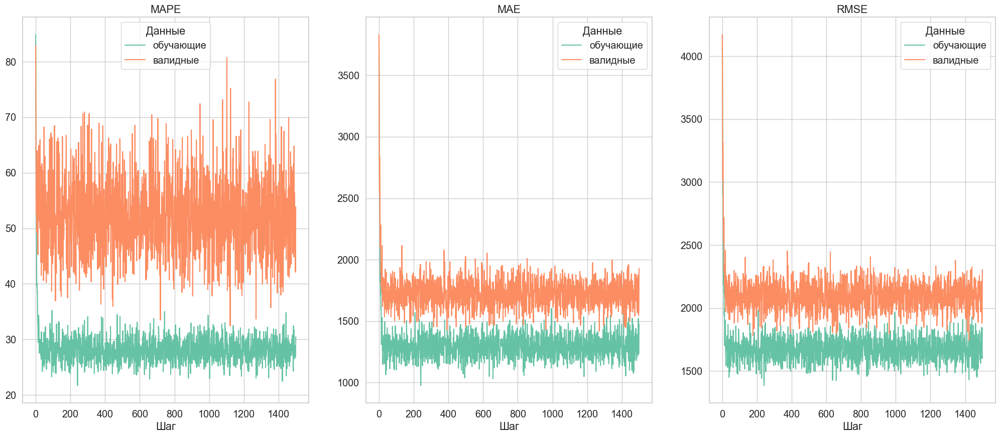

In [843]:
plt.figure(figsize=(25, 10))

plt.subplot(1, 3, 1)
plt.plot(range(1500), MAPE_train, label='обучающие')
plt.plot(range(1500), MAPE_valid, label='валидные')
plt.legend(title='Данные')
plt.title('MAPE')
plt.xlabel('Шаг')

plt.subplot(1, 3, 2)
plt.plot(range(1500), MAE_train, label='обучающие')
plt.plot(range(1500), MAE_valid, label='валидные')
plt.legend(title='Данные')
plt.title('MAE')
plt.xlabel('Шаг')

plt.subplot(1, 3, 3)
plt.plot(range(1500), RMSE_train, label='обучающие')
plt.plot(range(1500), RMSE_valid, label='валидные')
plt.legend(title='Данные')
plt.title('RMSE')
plt.xlabel('Шаг')

In [844]:
t = MAPE_valid.index(min(MAPE_valid))
t

1121

Минимальная ошибка при $t=1121, но оптимальной области мы достигаем при примерно $t=150$

Посчитайте ошибку на тестовой выборке.

In [845]:
X = np.insert(X_test, 0, np.array([1] * len(X_test)), axis=1)
predicted_test = X @ thetas[t]
final_MAPE = mean_absolute_percentage_error(Y_test, predicted_test)

Для визуализации можно изобразить на одном графике предсказанные значения и настоящие

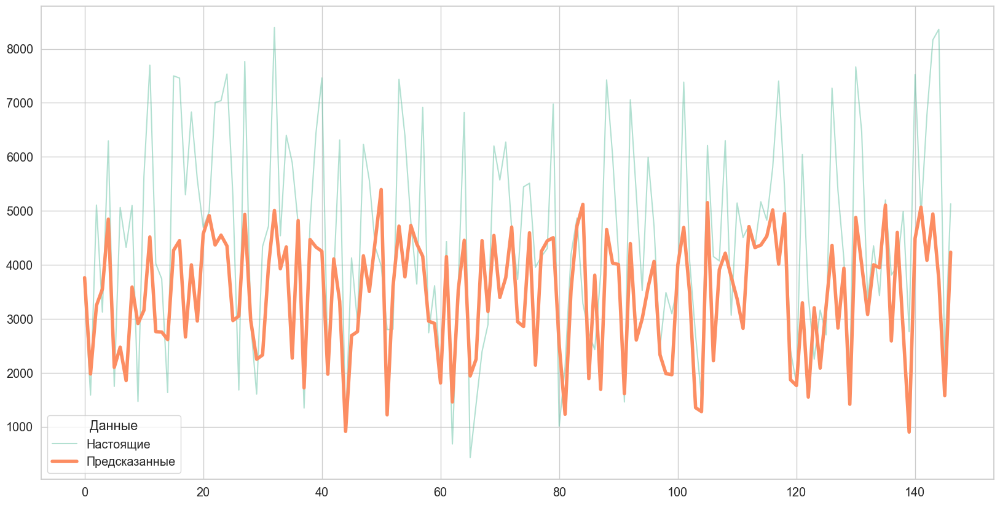

In [846]:
plt.figure(figsize=(20, 10))

plt.plot(range(len(Y_test)), Y_test, label='Настоящие', alpha=0.5)
plt.plot(range(len(Y_test)), predicted_test, label='Предсказанные', lw=4)
plt.legend(title='Данные')

In [847]:
final_MAPE

32.84526116939551

Сделайте выводы.

Ошибка test выборки равняется примерно $32$%, примерно такой же результат мы получили и для Ridge-регрессии.
А количество итераций, которые нам пришлось совершить для лучшего результата $t=150$.